In [1]:
import os
os.chdir(path='../')
import scanpy as sc
import numpy as np
import STForte.helper as stfhelper
import plotly.express as px
from sklearn.metrics import calinski_harabasz_score, silhouette_score
trial_name = "trial-Visium_FFPE_Human_Prostate_Cancer"
data_name = "Visium_FFPE_Human_Prostate_Cancer"
sc.set_figure_params(dpi=120)

/home/poncey/miniconda3/envs/stforte_env/lib/python3.9/site-packages/pytorch_lightning/utilities/seed.py:47: LightningDeprecationWarning: `pytorch_lightning.utilities.seed.seed_everything` has been deprecated in v1.8.0 and will be removed in v2.0.0. Please use `lightning_fabric.utilities.seed.seed_everything` instead.
  rank_zero_deprecation(
Global seed set to 0


In [2]:
adata = sc.read_h5ad(f"./{trial_name}/outputs/stforte.h5ad")
adata

AnnData object with n_obs × n_vars = 4371 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'STForte_Mask', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'spatial', 'umap'
    obsm: 'STForte_ATTR', 'STForte_COMB', 'STForte_TOPO', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [3]:
sc.pp.neighbors(adata, use_rep='STForte_ATTR')
elbow_res = np.arange(0.1, 1.0 + 0.05, 0.05)
ch_elbow = []
ss_elbow = []
for res in elbow_res:
    labels = sc.tl.leiden(adata, resolution=res, copy=True).obs["leiden"]
    ss_elbow.append(silhouette_score(adata.obsm['STForte_ATTR'], labels))
    ch_elbow.append(calinski_harabasz_score(adata.obsm['STForte_ATTR'], labels))

In [4]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])
# Add traces
fig.add_trace(
    go.Scatter(x=elbow_res, y=np.asarray(ch_elbow), name="Calinski Harabasz"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=elbow_res, y=np.asarray(ss_elbow), name="Silhouette Score"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Elbow Results"
)
# Set x-axis title
fig.update_xaxes(title_text="resolution")
# Set y-axes titles
fig.update_yaxes(title_text="Calinski Harabasz", secondary_y=False)
fig.update_yaxes(title_text="Silhouette Score", secondary_y=True)
fig.update_layout(template="plotly", font_family="Arial", width=640, height=400)
fig.write_image(f"{trial_name}/plots/elbow.pdf")
fig.show()

In [5]:
sc.pp.neighbors(adata, use_rep='STForte_ATTR')
sc.tl.leiden(adata, resolution=0.3)
adata.obs['leiden'] = adata.obs['leiden'].cat.rename_categories(dict(((i, f'C{int(i) + 1}') for i in adata.obs['leiden'].cat.categories)))
sc.tl.umap(adata)


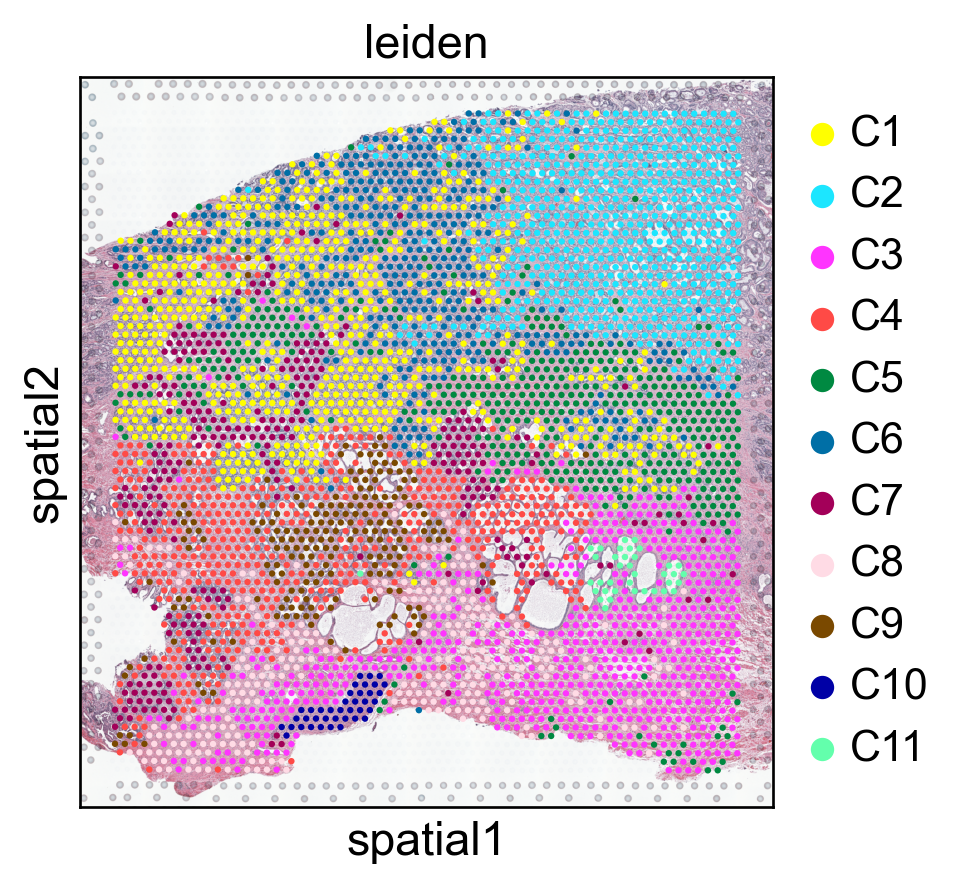

In [6]:
sc.pl.spatial(adata, color=['leiden'], palette=stfhelper.pl.godsnot_102)

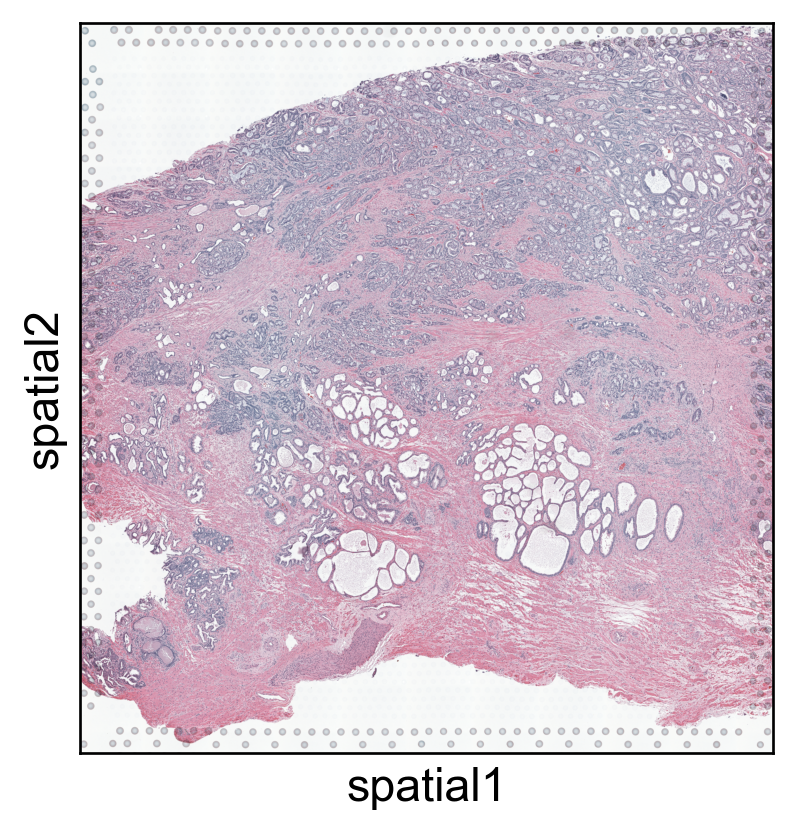

In [7]:
sc.pl.spatial(adata, )

/home/poncey/miniconda3/envs/stforte_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/poncey/miniconda3/envs/stforte_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/poncey/miniconda3/envs/stforte_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



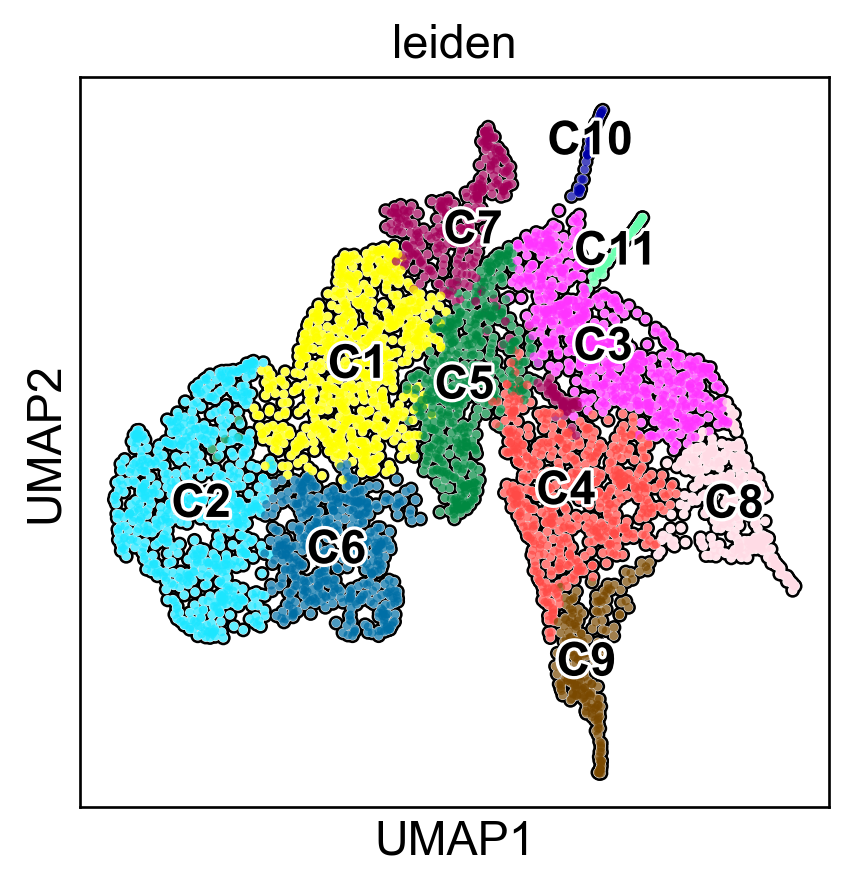

In [8]:
sc.pl.umap(adata, color=['leiden'],
           legend_loc="on data", legend_fontoutline=2, add_outline=True,)

In [9]:
adata_sp = sc.read_h5ad(f"./{trial_name}/outputs/sp.h5ad")
adata_sp

AnnData object with n_obs × n_vars = 17040 × 300
    obs: 'spot_instance', 'leiden_with_padding'
    uns: 'leiden_with_padding_colors', 'neighbors', 'umap'
    obsm: 'SP_ATTR_FP', 'SP_COMB', 'SP_TOPO', 'X_umap', 'spatial'
    obsp: 'A_STForte_conn', 'A_STForte_recon', 'connectivities', 'distances'

In [10]:
# Propagate annotations
n_clusters = len(adata.obs['leiden'].cat.categories)
stfhelper.annotation_propagate(adata_sp, "leiden", adata, latent_embed="SP_TOPO")
adata_sp.obs['leiden_with_padding'] = adata_sp.obs['leiden_with_padding'].cat.reorder_categories([f'C{ii}' for ii in range(1, n_clusters + 1)])

In [11]:
# UMAP for padded data
sc.pp.neighbors(adata_sp, use_rep="SP_TOPO")
sc.tl.umap(adata_sp)

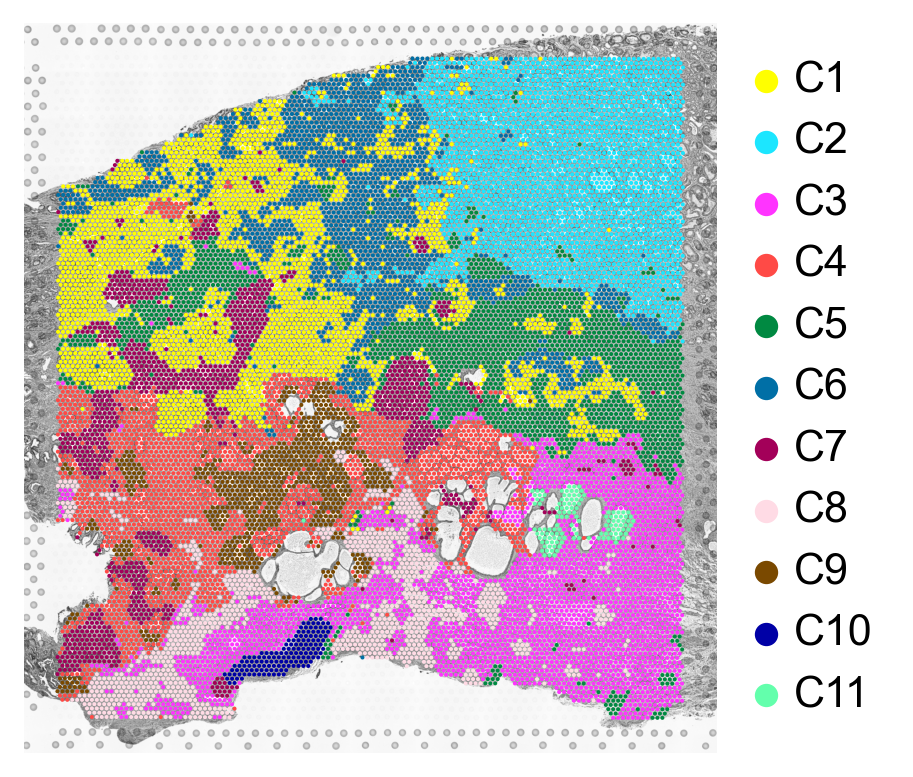

In [12]:
sc.pl.spatial(adata_sp, color=['leiden_with_padding'], size=0.625,
                  frameon=False,
                  img=adata.uns['spatial'][data_name]['images']['hires'], title="",
                  spot_size=adata.uns['spatial'][data_name]['scalefactors']['spot_diameter_fullres'], 
                  scale_factor=adata.uns['spatial'][data_name]['scalefactors']['tissue_hires_scalef'],
                  palette=stfhelper.pl.godsnot_102,
                  bw=True,
                  legend_fontoutline=4,
                  )

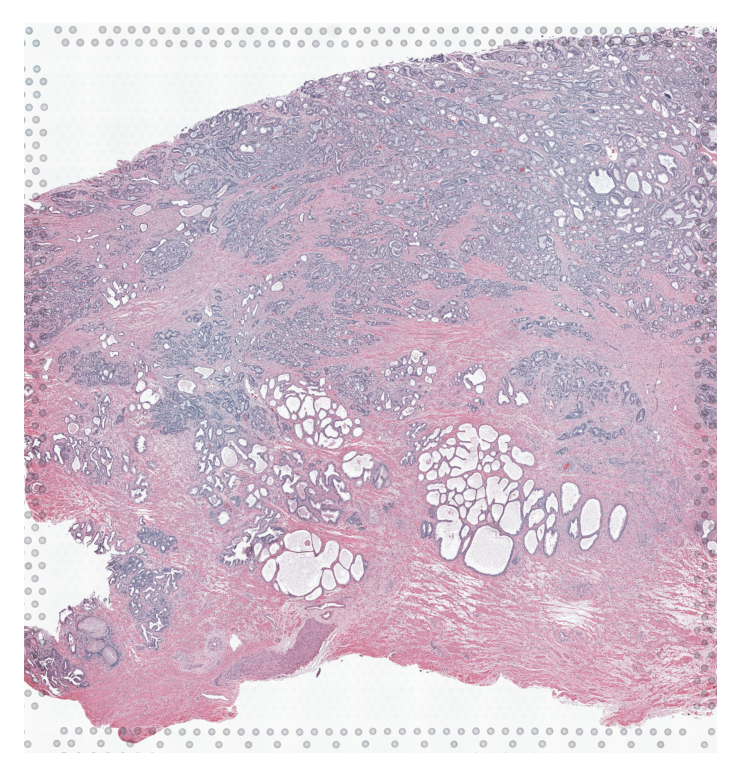

In [13]:
sc.pl.spatial(adata_sp, 
                  frameon=False,
                  img=adata.uns['spatial'][data_name]['images']['hires'], title="",
                  spot_size=adata.uns['spatial'][data_name]['scalefactors']['spot_diameter_fullres'], 
                  scale_factor=adata.uns['spatial'][data_name]['scalefactors']['tissue_hires_scalef'],
                  palette=px.colors.qualitative.Plotly,
                  legend_fontoutline=4,
                  )

/home/poncey/miniconda3/envs/stforte_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/poncey/miniconda3/envs/stforte_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/poncey/miniconda3/envs/stforte_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



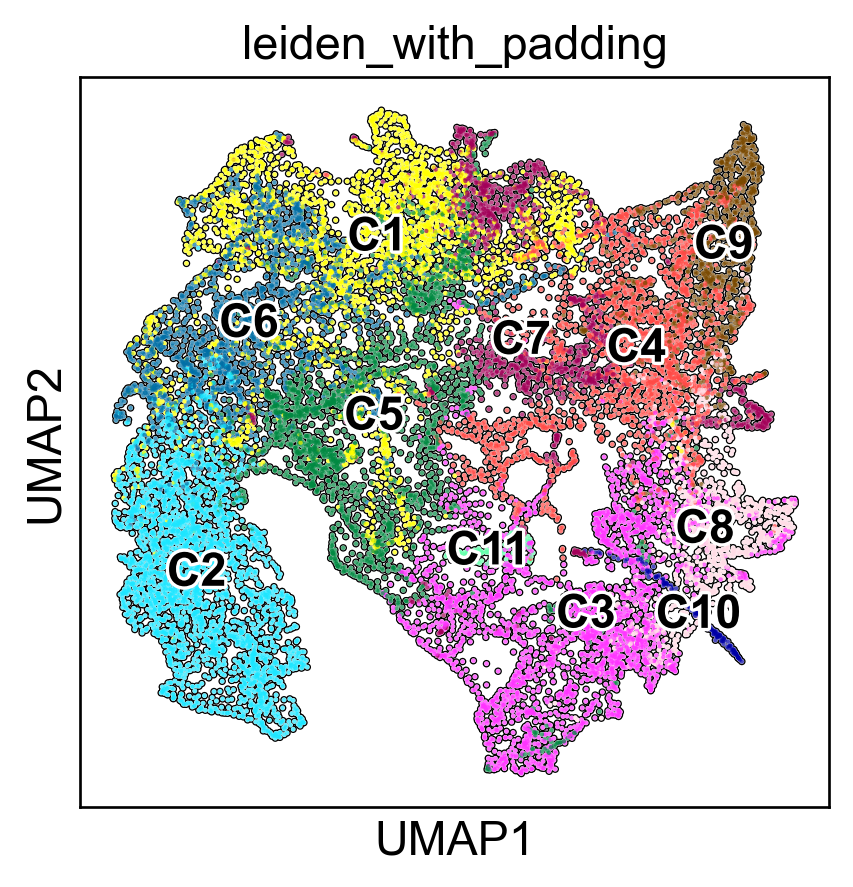

In [14]:
sc.pl.umap(adata_sp, color=['leiden_with_padding'],
           legend_loc="on data", legend_fontoutline=2, add_outline=True,)

In [15]:
adata.write_h5ad(f"./{trial_name}/outputs/stforte.h5ad")
adata_sp.write_h5ad(f"./{trial_name}/outputs/sp.h5ad")